##### Kode ini di adopsi dari TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Image classification

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/images/classification"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/images/classification.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

Kode ini dibuat sebagai contoh dalam melakukan klasifikasi daun yang terkena hama dan daun yang sehat menggunakan `tf.keras.Sequential` model, sedangkan dataset di load menggunakan `tf.keras.utils.image_dataset_from_directory` dengan memanfaatkan google drive sebagai penyimpanan dataset. berikut konsep yang digunakan dalam kode ini :

* Memuat kumpulan data dari memory secara efisien.
* Mengidentifikasi overfitting dan mengimplementasikan teknik untuk mencegahnya begitupula untuk augmentation dan dropout. 

Kode ini mengikuti dasar dari cara kerja machine learning yakni :

* Memeriksa dan memahami data
* Membuat runtutan input data
* Membuat model dari kumpulan data
* Melatih model dengan data
* Menguji model dengan data traning
* Meningkatkan ketajaman model dan mengulangi proses identifikasi agar lebih akurat

## Import TensorFlow dan library lainnya

In [153]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf

from google.colab import drive
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

## Initiation dataset

In [154]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Klasifikasi ini menggunakan 165 foto tumbuhan sehat dan terkena hama.

```
Tumbuhan/
  sehat/
  terkena hama/
```

In [155]:
import pathlib
# dataset di load dari object storage
# dataset_url = "https://storage.googleapis.com/rubanah-files/apple.tgz"
# data_dir = tf.keras.utils.get_file('apple', origin=dataset_url, untar=True)

# dataset di load dari google drive
data_dir = '/content/drive/My Drive/Tumbuhan'
data_dir = pathlib.Path(data_dir)

In [156]:
!ls "/content/drive/My Drive/Tumbuhan"

berhama		     plant-healthy-2.jpg  plant-pest-2.jpg
plant-healthy-1.jpg  plant-pest-1.jpg	  sehat


Setelah proses import dataset berhasil maka akan dihitung berapa jumlah gambar yang tersedia untuk di *training*

In [157]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

166


Contoh foto tumbuhan sehat:

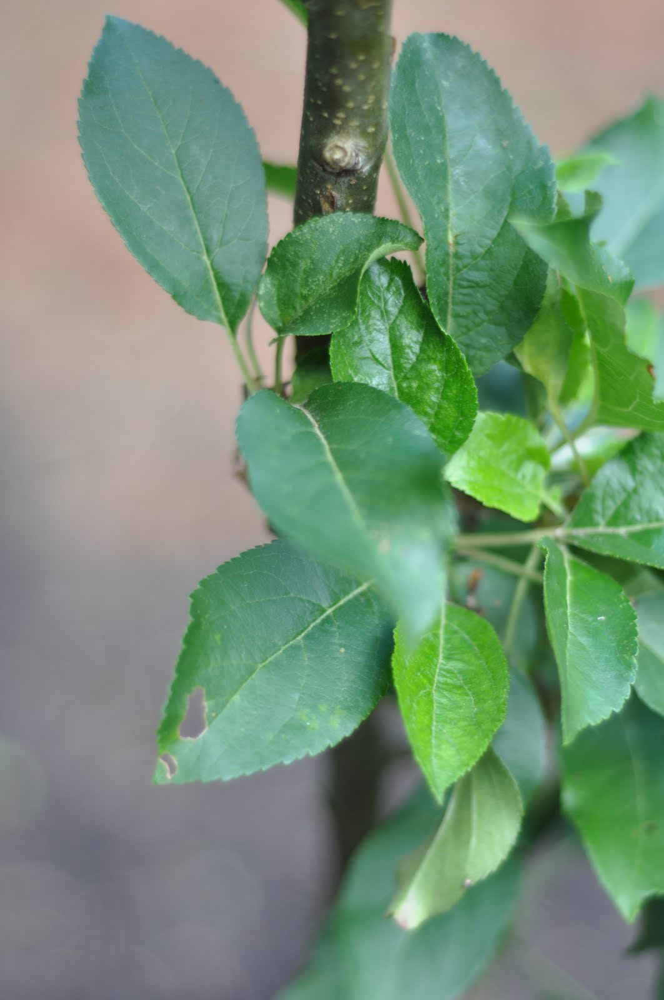

In [158]:
healthy = list(data_dir.glob('sehat/*'))
PIL.Image.open(str(healthy[0]))

# silahkan ubah array index untuk melihat gambar lainnya

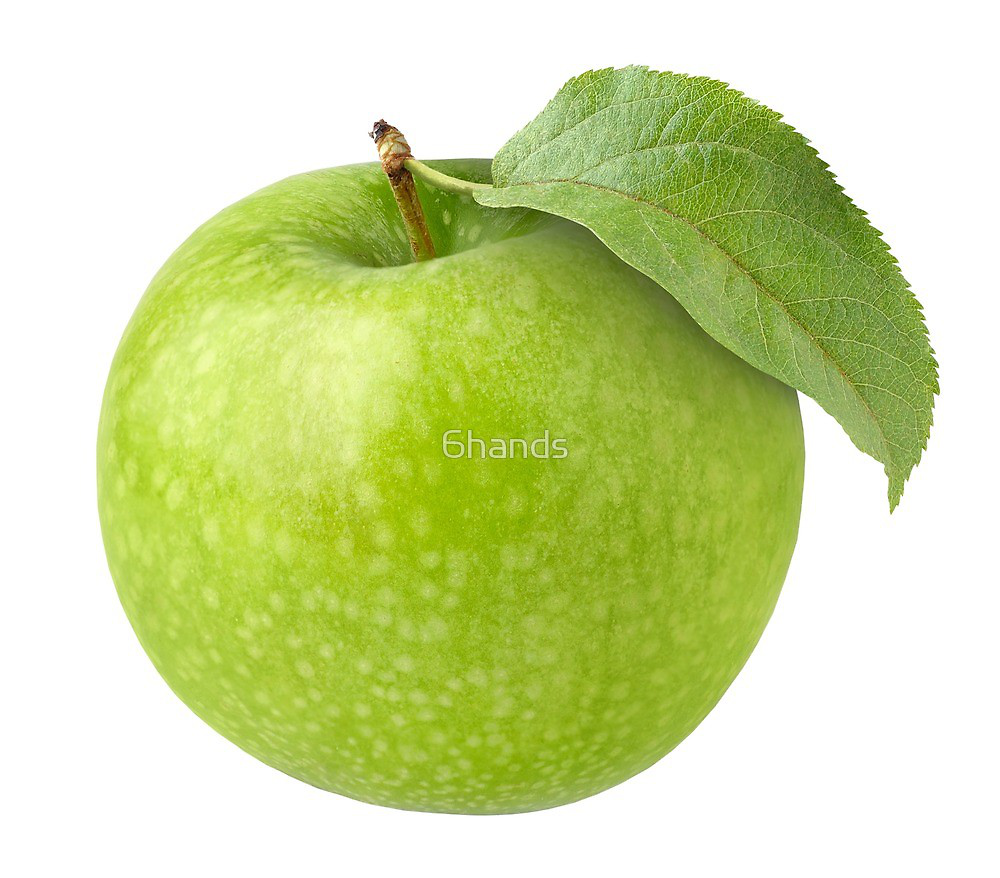

In [159]:
PIL.Image.open(str(healthy[1]))

# silahkan ubah array index untuk melihat gambar lainnya

Contoh tumbuhan terkena hama

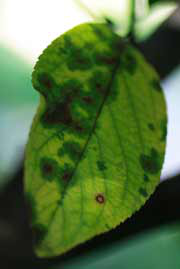

In [161]:
pest = list(data_dir.glob('berhama/*'))
PIL.Image.open(str(pest[0]))

# silahkan ubah array index untuk melihat gambar lainnya

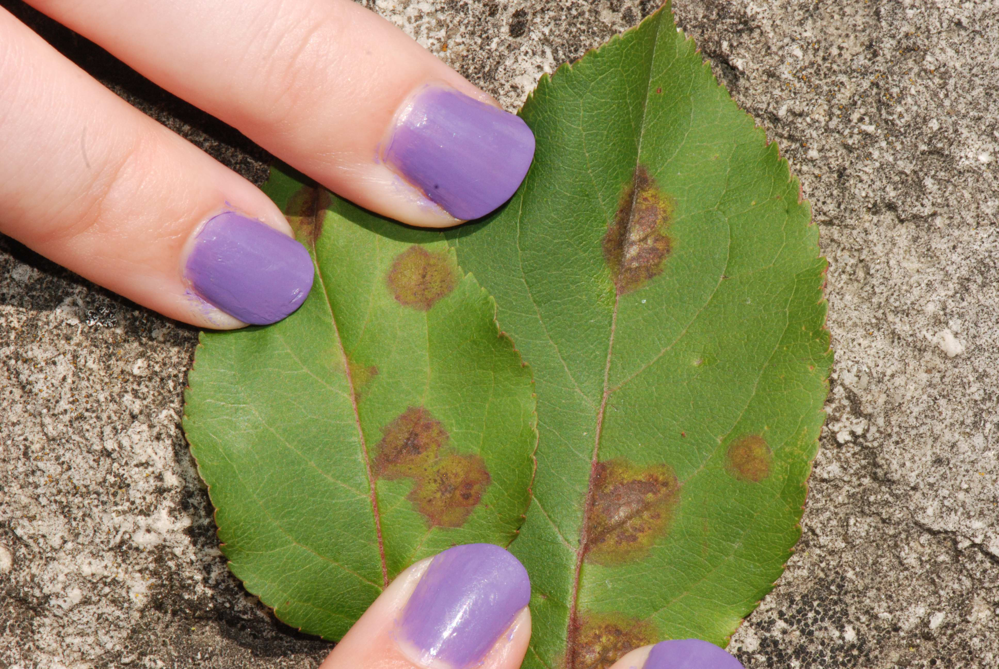

In [162]:
PIL.Image.open(str(pest[1]))

# silahkan ubah array index untuk melihat gambar lainnya

# Memuat data menggunakan **Keras**

Memuat data dari dataset dengan menggunakan `tf.keras.utils.image_dataset_from_directory`. proses ini akan memmbuat dataset di load dan dimasukan kedalam `tf.data.Dataset` .

## Membuat model dataset

Menentukan parameter-parameter untuk meload image

In [163]:
batch_size = 32
img_height = 180
img_width = 180

Dalam proses pembuatan dataset alangkah baiknya menggunakan format 80% : 20% yakni 80% data digunakan untuk proses training (pelatihan) dana 20% digunakan untuk proses testing (validasi).

In [164]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 166 files belonging to 2 classes.
Using 133 files for training.


In [165]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 166 files belonging to 2 classes.
Using 33 files for validation.


Membuat `class_names` dari direktori dataset


In [166]:
class_names = train_ds.class_names
print(class_names)

['berhama', 'sehat']


## Membuat visualisasi data

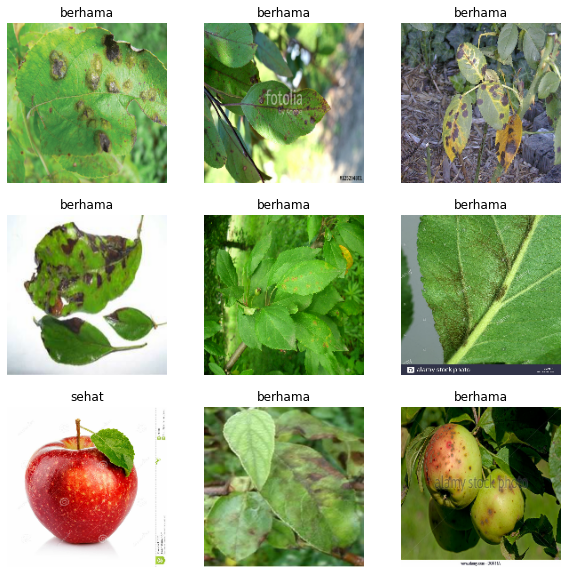

In [167]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Langkah selanjutnya yaitu melatih model menggunakan kumpulan data yang telah dibuat dengan cara memasukannya ke dalam `Model.fit`

In [168]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


image_batch adalah tensor dari bentuk (32, 180, 180, 3). hal ini merupakan kumpulan dari 32 gambar dengan bentuk 180x180x3 (dimensi terakhir mengacu pada code warna RGB). label_batch adalah tensor dari bentuk (32), merupakan label yang sesuai dengan 32 gambar.

pada tahap ini anda bisa memanggil .numpy() pada tensor image_batch dan labels_batch untuk mengonversinya menjadi numpy.ndarray.

## Konfigurasi performa dataset

Pastikan menggunakan buffered prefetching untuk menghasilkan data dari disk tanpa I/O menjadi blocking. hal ini merupakan dua metode penting yang harus digunakan saat memuat data:

- `Dataset.cache` menyimpan gambar dalam memori setelah mereka dimuat dari disk selama epoch pertama. Ini akan memastikan kumpulan data tidak menjadi hambatan saat melatih model. Jika kumpulan data terlalu besar untuk dimasukkan ke dalam memori, bisa juga menggunakan metode ini untuk membuat cache di disk yang berkinerja baik.
- `Dataset.prefetch` overlaps data preprocessing dan model execution ketika proses training.

In [169]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Standarisasi data

Nilai RGB berada dalam kisaran [0, 255]. hal ini tidak ideal untuk neural network; secara umum harus dibuat menjadi nilai input yang kecil.

Di sini, input akan menstandardisasi nilai agar berada dalam kisaran [0, 1] dengan menggunakan `tf.keras.layers.Rescaling`:

In [170]:
normalization_layer = layers.Rescaling(1./255)

Ada dua cara untuk menggunakan `normalization_layer` ini, bisa menerapkan secara langsung kedalam dataset dengan menggunakan `Dataset.map`:

In [171]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image)) 

0.02458901 1.0


Atau, menyertakan `nomralization_layer` di dalam model, hal ini membuat cara penerapan lebih sederhana. pendekatan ini yang digunakan dikode ini.

# Membuat model

Model [Sequential](https://www.tensorflow.org/guide/keras/sequential_model) terdiri dari tiga blok konvolusi (`tf.keras.layers.Conv2D`) dengan max pooling layer (`tf.keras.layers .MaxPooling2D`) di masing-masingnya. Ada lapisan yang sepenuhnya terhubung (`tf.keras.layers.Dense`) dengan 128 unit di atasnya yang diaktifkan oleh fungsi aktivasi ReLU (`'relu'`).

In [172]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

## Compile model

pilih fungsi `tf.keras.optimizers.Adam` optimizer dan `tf.keras.losses.SparseCategoricalCrossentropy` untuk fungsi loss. Untuk melihat akurasi pelatihan dan validasi untuk setiap periode pelatihan, teruskan argumen `metrics` ke `Model.compile`.

In [180]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

## Model Hasil

Lihat semua lapisan jaringan menggunakan metode `Model.summary` model:

In [181]:
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_12 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_24 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 45, 45, 64)      

## Melatih Model

In [182]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
5/5 [==============================] - 1s 90ms/step - loss: 0.2586 - accuracy: 0.9173 - val_loss: 1.2553 - val_accuracy: 0.7879
Epoch 2/10
5/5 [==============================] - 0s 53ms/step - loss: 0.0205 - accuracy: 0.9925 - val_loss: 0.7755 - val_accuracy: 0.7576
Epoch 3/10
5/5 [==============================] - 0s 48ms/step - loss: 0.1570 - accuracy: 0.9474 - val_loss: 0.6293 - val_accuracy: 0.7576
Epoch 4/10
5/5 [==============================] - 0s 44ms/step - loss: 0.0741 - accuracy: 0.9774 - val_loss: 0.8234 - val_accuracy: 0.7879
Epoch 5/10
5/5 [==============================] - 0s 39ms/step - loss: 0.0276 - accuracy: 0.9925 - val_loss: 0.7534 - val_accuracy: 0.8182
Epoch 6/10
5/5 [==============================] - 0s 39ms/step - loss: 0.0162 - accuracy: 1.0000 - val_loss: 0.8311 - val_accuracy: 0.8182
Epoch 7/10
5/5 [==============================] - 0s 49ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.9106 - val_accuracy: 0.8182
Epoch 8/10
5/5 [===========

## Menampilkan hasil training (pelatihan)



Membuat plots dari loss dan accuracy pada training dan validation set:

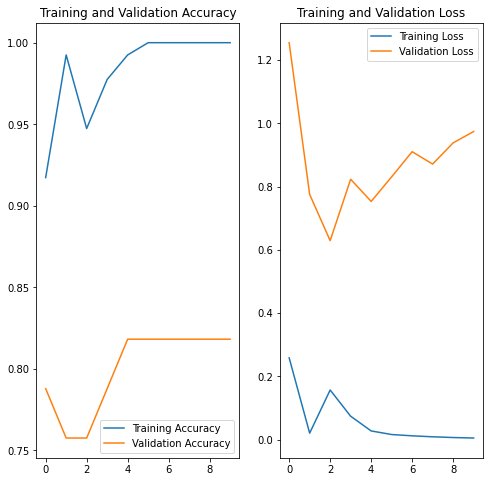

In [183]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Plot menunjukkan bahwa akurasi pelatihan dan akurasi validasi berbeda jauh.

## Overfitting

Perbedaan akurasi antara akurasi pelatihan dan validasi terlihat—tanda overfitting.

Ketika ada sejumlah kecil contoh pelatihan, model terkadang belajar dari noise atau detail yang tidak diinginkan dari contoh pelatihan—sejauh hal itu berdampak negatif pada kinerja model pada contoh baru. Fenomena ini dikenal sebagai overfitting. Ini berarti bahwa model akan mengalami kesulitan untuk melakukan generalisasi pada dataset baru.

Ada beberapa cara untuk melawan overfitting dalam proses pelatihan. Dalam hal ini menggunakan augmentasi data dan menambahkan Dropout ke dalam model.

## Augmentasi data

In [184]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

Mari kita coba visualisasikan seperti apa beberapa contoh augmented dengan menerapkan augmentasi data ke gambar yang sama beberapa kali:

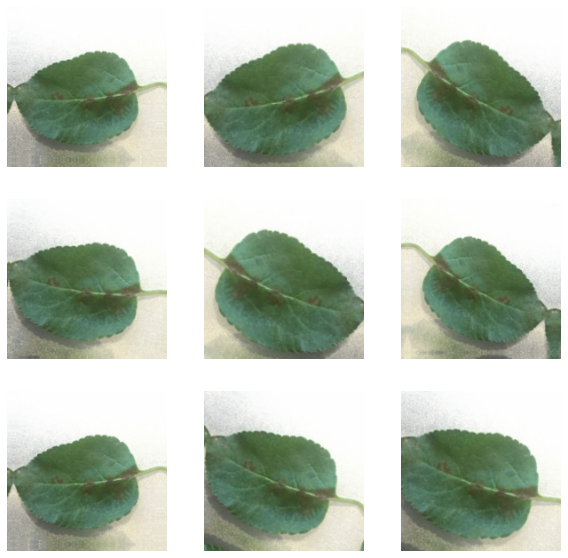

In [185]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

augmentasi data mampu melatih model dalam sekejap.

## Dropout

Teknik lain untuk mengurangi overfitting adalah dengan memperkenalkan regularisasi dropout ke jaringan.

Ketika Anda menerapkan dropout ke lapisan, secara acak menjatuhkan sejumlah unit output dari lapisan selama proses pelatihan. Dropout mengambil angka pecahan sebagai nilai inputnya, dalam bentuk seperti 0.1, 0.2, 0.4, dll. Ini berarti drop out 10%, 20% atau 40% dari unit output secara acak dari lapisan yang diterapkan.

Mari buat jaringan saraf baru dengan tf.keras.layers.Dropout sebelum menggunakan augmented images:

In [186]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

## Compile dan train ulang model

In [187]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [188]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_13 (Sequential)  (None, 180, 180, 3)       0         
                                                                 
 rescaling_13 (Rescaling)    (None, 180, 180, 3)       0         
                                                                 
 conv2d_27 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_28 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                

In [189]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
5/5 [==============================] - 2s 107ms/step - loss: 0.9424 - accuracy: 0.5714 - val_loss: 0.7974 - val_accuracy: 0.3939
Epoch 2/15
5/5 [==============================] - 0s 58ms/step - loss: 0.6156 - accuracy: 0.6842 - val_loss: 0.5276 - val_accuracy: 0.7879
Epoch 3/15
5/5 [==============================] - 0s 53ms/step - loss: 0.5602 - accuracy: 0.7068 - val_loss: 0.5432 - val_accuracy: 0.7273
Epoch 4/15
5/5 [==============================] - 0s 47ms/step - loss: 0.5777 - accuracy: 0.7068 - val_loss: 0.4493 - val_accuracy: 0.8182
Epoch 5/15
5/5 [==============================] - 0s 54ms/step - loss: 0.4719 - accuracy: 0.7970 - val_loss: 0.4196 - val_accuracy: 0.7879
Epoch 6/15
5/5 [==============================] - 0s 46ms/step - loss: 0.4486 - accuracy: 0.8271 - val_loss: 0.4490 - val_accuracy: 0.8182
Epoch 7/15
5/5 [==============================] - 0s 56ms/step - loss: 0.4478 - accuracy: 0.8045 - val_loss: 0.5227 - val_accuracy: 0.7879
Epoch 8/15
5/5 [==========

## Menampilkan hasil training(pelatihan)

Setelah menerapkan augmentasi data dan `tf.keras.layers.Dropout`, overfitting lebih sedikit daripada sebelumnya, dan akurasi pelatihan dan validasi semakin selaras:

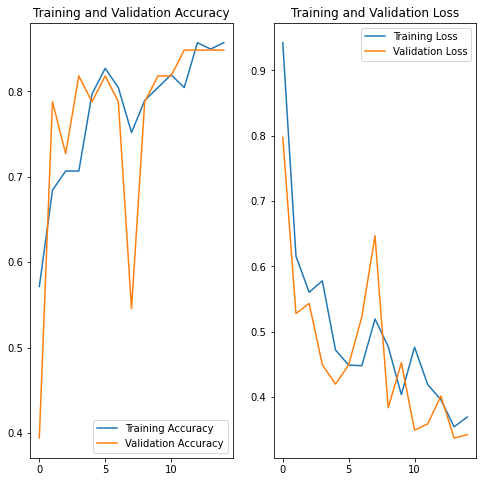

In [190]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [215]:
!ls "/content/drive/My Drive/Tumbuhan"

berhama		     plant-healthy-2.jpg  plant-pest-2.jpg
plant-healthy-1.jpg  plant-pest-1.jpg	  sehat


## Prediksi dengan menggunakan data uji

gunakan model untuk mengklasifikasikan gambar yang tidak disertakan dalam set pelatihan atau validasi.

Note: Data augmentation dan dropout layers tdak aktif dalam inference time.

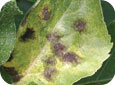

In [216]:
plant_test = '/content/drive/My Drive/Tumbuhan/plant-pest-1.jpg'
PIL.Image.open(plant_test)

In [217]:
# leaf_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/592px-Red_sunflower.jpg"
# sunflower_path = tf.keras.utils.get_file('Red_sunflower', origin=sunflower_url)


img = tf.keras.utils.load_img(
    plant_test, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "Tumbuhan ini kemungkinan besar '{}' dengan {:.2f} persen kemiripan."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

Tumbuhan ini kemungkinan besar 'berhama' dengan 95.32 persen kemiripan.
